# Introduction to Human Pose Estimation for Robotics

<a href="https://colab.research.google.com/drive/1JpIDhhMHealeajrV5Ul3Am7V0RtgWMrK?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Author:** Tamlin Love

**Reviewers:** Jenalea Rajab, Alexandra Barry

Welcome to this tutorial on Human Pose Estimation for Robotics! In this workshop, we will explore how robots can perceive and interpret human poses using deep learning techniques. Human pose estimation is a critical capability in robotics, enabling machines to understand human movements, gestures, and intentions — opening up a wide range of applications in automation, human-robot interaction, and industrial robotics.

## Why Pose Estimation in Robotics?
Robotics is revolutionizing automation by performing tasks with precision, efficiency, and adaptability. From manufacturing assembly lines to healthcare assistance, robots are increasingly working alongside humans. To ensure seamless and safe collaboration, robots must accurately perceive human actions. This is where pose estimation becomes essential.

## Relevance of Pose Estimation in Robotics
Human-Robot Collaboration (HRC): In shared workspaces, robots must detect human poses to avoid collisions and respond appropriately to human actions.

**Industrial Automation**: Robots can monitor workers’ posture to prevent ergonomic risks or assist in physically demanding tasks.

**Social and Assistive Robotics**: Robots in healthcare or domestic settings use pose estimation to understand gestures, provide support, or guide movements.

**Autonomous Systems**: Drones and mobile robots leverage pose estimation for navigation and interaction in dynamic environments.

In this tutorial, you'll be walking through the way a social robot perceives the world around it, understands humans in the environment, and makes decisions based on these perceptions.

To begin, we'll set up the repository in this notebook and make sure it's up to date, and import the necessary libraries.


**To read a bit more about using and improving human pose estimation with Pepper, see the following paper**:

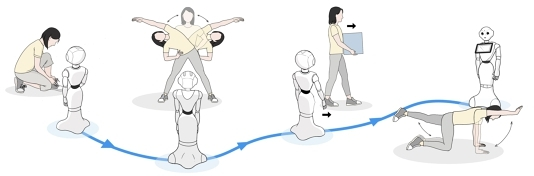

**Research Paper:** [PepperPose](https://wangchongyang.ai/assets/pdf/PepperPose_CHI.pdf)

**Video:** [PepperPose Video Presentation](https://www.youtube.com/watch?v=MBV6Xyqp16E)


# Table of Contents
1. [Introduction to Human Pose Estimation for Robotics](#Introduction-to-Human-Pose-Estimation-for-Robotics)
2. [Section 1 - The Robot's Camera](#Section-1---The-Robot's-Camera)
3. [Section 2 - Pose Estimation](#Section-2---Pose-Estimation)
4. [Section 3 - Feature Extraction](#Section-3---Feature-Extraction)
5. [Section 4 - Decision Making](#Section-4---Decision-Making)

### Setup the environment - Install and import necessary libraries

In [ ]:
# Retrieve files
!git clone https://github.com/tamlinlove/indabatut2data.git
%cd /content/indabatut2data
!git pull
%cd ../../

# Install necessary libraries
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
import copy
import math
import pandas as pd

## Section 1 - The Robot's Camera
In order to autonomously make decisions, a robot needs to be able to **sense** the world around it. Just like humans use sight, hearing, smell, taste and touch to sense what is around us, robots in the real world can be equipped with many different types of sensors. For the human senses, we can use:

* Cameras and distance sensors such as depth cameras (sight)
* Microphones (hearing)
* Tactile, pressure and contact sensors (touch)

Sensors have even been developed to allow robots to [smell](https://www.eurekalert.org/news-releases/976786) and [taste](https://www.popsci.com/technology/electronic-tongue-ai-robot/)!

Of course, the list above is not exhaustive. Some notable omissions include accelerometers, gyroscopes, GPS sensors, LiDAR, infrared sensors and force and torque sensors.

In today's tutorial, we'll be using a robot equipped with an RGBD camera, which gives us both a colour image (RGB) and a depth image (D) that tells us how far away things in the environment are.

Pepper has three cameras (two RGB cameras and one 3D camera in his head) as well as a sensitive microphone. Pepper has many sensors including two ultrasound transmitters and receivers, six laser sensors and three obstacle detectors placed in his legs.



### Let's start by loading up some colour images taken some time ago on the robot's camera.

In [ ]:
def load_images(folder,colour):
    images = []
    timestamps = []
    for filename in sorted(os.listdir(folder)):
        if colour:
          img = cv2.imread(os.path.join(folder,filename))
          img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
          img = cv2.imread(os.path.join(folder,filename),0)
        timestamp = int(filename.split("_")[1].split(".")[0])
        if img is not None:
            images.append(img)
            timestamps.append(timestamp)
    return images,timestamps

colour_images,colour_timestamps = load_images("/content/indabatut2data/n1/colour", colour=True)

We can plot these images in a little animation to see what we're working with...

In [ ]:
from matplotlib import animation
from IPython.display import display, HTML

def plot_sequence_images(image_array):
    dpi = 72.0
    xpixels, ypixels = image_array[0].shape[:2]
    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    im = plt.figimage(image_array[0])



    def animate(i):
        im.set_array(image_array[i])

        fig.suptitle(f"{i}")


        return (im,)

    anim = animation.FuncAnimation(fig, animate, frames=len(image_array), interval=40, repeat_delay=1, repeat=False)
    display(HTML(anim.to_html5_video()))

In [ ]:
plot_sequence_images(colour_images)

<Figure size 640x480 with 0 Axes>

So far so good. What we're seeing is an RGB image, which should be very familiar to you. Next, let's see what the D channel in the RGB camera is showing us.

In [ ]:
depth_images,depth_timestamps = load_images("/content/indabatut2data/n1/depth", colour=False)

In [ ]:
plot_sequence_images(depth_images)

<Figure size 640x480 with 0 Axes>

What you're seeing is a monochrome or grayscale image with the values of each pixel indicating the distance between that point in the environment and the camera. The lower the number (i.e. the darker the pixel), the closer the point.

If the above image is hard to see, we can clip off higher values and improve the contrast a bit...

In [ ]:
def increase_depth_contrast(depth_images):
  contrast_depth_images = []
  for di in depth_images:
    minval = 0
    maxval = 30
    cdi = np.clip(di, minval, maxval)
    cdi = np.array(((cdi - minval) / (maxval - minval)) * 255).astype(np.uint8)
    cdi = cv2.cvtColor(cdi,cv2.COLOR_GRAY2RGB)
    contrast_depth_images.append(cdi)
  return contrast_depth_images

contrast_depth_images = increase_depth_contrast(depth_images)

In [ ]:
plot_sequence_images(contrast_depth_images)

<Figure size 640x480 with 0 Axes>

By now, you should have noticed how noisy the depth feed is. Sensor noise is a huge problem in robotics, and adds a great deal of uncertainty that a robot needs to deal with.

There are many ways to deal with noise and reduce uncertainty, but we won't be covering any of those approaches today.

## Section 2 - Pose Estimation
If our robot is going to interact with people, it should probably be able to detect people and know where they are. To do this, we can use pose estimation techniques from computer vision to recover the human's "skeleton" - a set of keypoints for different "joints" on the human body.

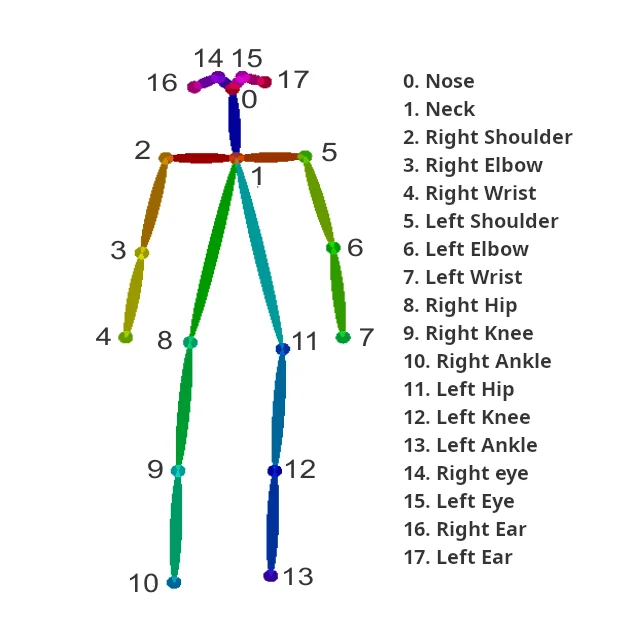

To simplify things and keep this notebook's compute down, we're going to import some keypoints generated earlier using [OpenDR's](https://github.com/opendr-eu/opendr) implementation of [open pose](https://github.com/CMU-Perceptual-Computing-Lab/openpose).

In [ ]:
skeletons = pd.read_csv("/content/indabatut2data/n1/skeletons/bizsh.csv")
skeletons

,Timestamp,nose.x,nose.y,nose.c,neck.x,neck.y,neck.c,r_sho.x,r_sho.y,r_sho.c,...,r_eye.c,l_eye.x,l_eye.y,l_eye.c,r_ear.x,r_ear.y,r_ear.c,l_ear.x,l_ear.y,l_ear.c
0,1.701078e+18,0.418750,0.352083,0.742451,0.354688,0.466667,0.742451,0.303125,0.470833,0.742451,...,0.742451,0.396875,0.329167,0.742451,-1.000000,-1.000000,0.000000,0.334375,0.345833,0.742451
1,1.701078e+18,0.421875,0.350000,0.756224,0.367188,0.466667,0.756224,0.309375,0.470833,0.756224,...,0.756224,0.398438,0.322917,0.756224,-1.000000,-1.000000,0.000000,0.343750,0.339583,0.756224
2,1.701078e+18,0.426562,0.345833,0.747826,0.378125,0.466667,0.747826,0.315625,0.472917,0.747826,...,0.747826,0.403125,0.320833,0.747826,-1.000000,-1.000000,0.000000,0.354688,0.337500,0.747826
3,1.701078e+18,0.432813,0.345833,0.736409,0.395312,0.466667,0.736409,0.321875,0.472917,0.736409,...,0.736409,0.404687,0.318750,0.736409,0.465625,0.318750,0.736409,0.357812,0.335417,0.736409
4,1.701078e+18,0.437500,0.339583,0.780882,0.412500,0.464583,0.780882,0.331250,0.472917,0.780882,...,0.780882,0.414062,0.318750,0.780882,0.467187,0.318750,0.780882,0.370313,0.335417,0.780882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,1.701078e+18,0.281250,0.229167,0.356118,0.462500,0.483333,0.356118,0.351562,0.500000,0.356118,...,0.356118,0.250000,0.175000,0.356118,0.445312,0.175000,0.356118,-1.000000,-1.000000,0.000000
254,1.701078e+18,0.260938,0.225000,0.348750,0.445312,0.479167,0.348750,0.343750,0.500000,0.348750,...,0.348750,0.232812,0.170833,0.348750,0.421875,0.172917,0.348750,-1.000000,-1.000000,0.000000
255,1.701078e+18,0.239063,0.225000,0.329475,0.423438,0.472917,0.329475,0.337500,0.495833,0.329475,...,0.329475,0.215625,0.170833,0.329475,0.398438,0.170833,0.329475,-1.000000,-1.000000,0.000000
256,1.701078e+18,0.215625,0.222917,0.291803,0.403125,0.460417,0.291803,0.331250,0.479167,0.291803,...,0.291803,0.192188,0.166667,0.291803,0.379687,0.175000,0.291803,-1.000000,-1.000000,0.000000


For each keypoint, we have an x and y coordinate ranging from 0 to 1, and a confidence value (c) also between 0 and 1 which tells us how "good" our estimate is (remember, robots need to reason under uncertainty!).

To see if our pose estimates are any good, let's draw them on the colour images from earlier. To do this, we'll need to transform our coordinates (something we have to do all the time in robotics) from numbers between 0 and 1 to pixel coordinates in the image.

In [ ]:
def normalised_point_to_pixel_coordinate(x,y,image_shape):
  '''
  YOUR CODE GOES HERE

  Hint: x and y are numbers between 0 and 1
  Hint: image_shape is a tuple (w,h), where w is the width and h is the height
  Hint: Where on the image should we expect to find (x=0,y=0)? What about (x=1,y=1)?

  This function should return a tuple of integers (x_img,y_img), which are the pixel coordinates
  '''

In [ ]:
#@title Solution

def normalised_point_to_pixel_coordinate(x,y,image_shape):

  return (int(x * image_shape[1]),int(y * image_shape[0]))

If our simple coordinate transformation is working properly, we should be able to annotate each image with a little skeleton drawing and generate another animation.

In [ ]:
'''
The Joint class represents a single joint in a human skeleton, storing its normalized x and y coordinates (between 0 and 1) and a confidence score (c).
If the x or y coordinate is -1, it means the joint was not detected, and its coordinates are set to None.
'''

class Joint:
  def __init__(self,x,y,c):
    if x == -1 or y == -1:
      self.x = None
      self.y = None
    else:
      self.x = x
      self.y = y
    self.c = c

  def __str__(self):
    return f"({self.x},{self.y})"

class HumanBody:
  joints = {
        "nose":0,
        "neck":1,
        "r_sho":2,
        "r_elb":3,
        "r_wri":4,
        "l_sho":5,
        "l_elb":6,
        "l_wri":7,
        "r_hip":8,
        "r_knee":9,
        "r_ank":10,
        "l_hip":11,
        "l_knee":12,
        "l_ank":13,
        "r_eye":14,
        "l_eye":15,
        "r_ear":16,
        "l_ear":17,
    }

  skeleton_pairs = [
            ("r_ear","r_eye"),
            ("r_eye","nose"),
            ("l_ear","l_eye"),
            ("l_eye","nose"),
            ("nose","neck"),
            ("neck","r_sho"),
            ("neck","l_sho"),
            ("r_sho","r_elb"),
            ("r_elb","r_wri"),
            ("l_sho","l_elb"),
            ("l_elb","l_wri"),
            ("r_sho","r_hip"),
            ("l_sho","l_hip"),
            ("r_hip","l_hip"),
            ("r_hip","r_knee"),
            ("r_knee","r_ank"),
            ("l_hip","l_knee"),
            ("l_knee","l_ank"),
        ]

  def __init__(self,row):
    self.time = row[0]
    self.skeleton = []
    for i in range(18):
      joint = Joint(row[3*i + 1],row[3*i + 2],row[3*i + 3])
      self.skeleton.append(joint)

'''
The annotate_image function takes an image and an optional image shape as input.
It creates a copy of the input image and then draws the human skeleton on it based on the joint coordinates stored in the HumanBody object.
It iterates through each joint and draws a circle at its pixel coordinates if the coordinates are not None.
It then iterates through the skeleton pairs and draws a line connecting the two joints in each pair if both joints have valid coordinates.
The function returns the annotated image.
'''

  def annotate_image(self,image,imshape=None,colour=(0, 255, 255)):
    image = copy.deepcopy(image)
    if imshape is None:
      imshape = image.shape
    for joint in self.skeleton:
      if joint.x is not None:
        img_coords = normalised_point_to_pixel_coordinate(joint.x,joint.y,imshape)
        cv2.circle(image,img_coords, 5, colour, -1)
    for pair in self.skeleton_pairs:
      p0 = self.skeleton[self.joints[pair[0]]]
      p1 = self.skeleton[self.joints[pair[1]]]
      if p0.x is None or p1.x is None:
        continue
      p0_img = normalised_point_to_pixel_coordinate(p0.x,p0.y,imshape)
      p1_img = normalised_point_to_pixel_coordinate(p1.x,p1.y,imshape)
      cv2.line(image,p0_img, p1_img, colour, thickness=3, lineType=8)
    return image

In [ ]:
'''
The find_neighbours function takes a timestamp, a pandas DataFrame of poses, and a column name as input.
It searches for rows in the DataFrame where the timestamp in the specified column exactly matches the input timestamp.
If an exact match is found, it returns a list containing the index of the matching row.
If no exact match is found, it finds the indices of the rows with the closest timestamps
(one lower and one higher than the input timestamp) and returns a list containing these two indices.
'''

def find_neighbours(value, df, colname):
    exactmatch = df[df[colname] == value]
    if not exactmatch.empty:
        return [exactmatch.index]
    else:
        lowerneighbour_ind = df[df[colname] < value][colname].idxmax()
        upperneighbour_ind = df[df[colname] > value][colname].idxmin()
        return [lowerneighbour_ind, upperneighbour_ind]

annotated_images = []
poses_2d = []
skeleton_indices = []

for i in range(len(colour_images)):
  img = colour_images[i]
  t = colour_timestamps[i] + 3619608177230159
  if t < skeletons["Timestamp"].iloc[0]:
    annotated_images.append(img)
    poses_2d.append(None)
    skeleton_indices.append(None)
    continue
  if t > skeletons["Timestamp"].iloc[-1]:
    annotated_images.append(img)
    poses_2d.append(None)
    skeleton_indices.append(None)
    continue
  skel_i = find_neighbours(t,skeletons,"Timestamp")
  if len(skel_i) == 1:
    closest_index = 0
  else:
    di0 = abs(skeletons.loc[skel_i[0]]["Timestamp"]-t)
    di1 = abs(skeletons.loc[skel_i[1]]["Timestamp"]-t)
    if di0 < di1:
      closest_index = 0
    else:
      closest_index = 1
  row = skeletons.loc[skel_i[closest_index]].values.flatten().tolist()
  body = HumanBody(row)
  poses_2d.append(body)
  skeleton_indices.append(skel_i[0])
  annotated_images.append(body.annotate_image(img))

In [ ]:
plot_sequence_images(annotated_images)

<Figure size 640x480 with 0 Axes>

Nice! But how do we take 2D skeleton keypoints in the image coordinates and transform them into 3D points in the world?

**Questions**
*   What information can we use to take 2D points and turn them into 3D points?
*   How do you think we would use this information?


## Section 3 - Feature Extraction
Implementing the transformation from 2D to 3D can be finicky, and in the interest of time we're once again going to load some 3D poses generated earlier.

In [ ]:
poses = pd.read_csv("/content/indabatut2data/n1/poses/bizsh.csv")
poses

,Timestamp,nose.x,nose.y,nose.z,neck.x,neck.y,neck.z,r_sho.x,r_sho.y,r_sho.z,...,r_eye.z,l_eye.x,l_eye.y,l_eye.z,r_ear.x,r_ear.y,r_ear.z,l_ear.x,l_ear.y,l_ear.z
0,1.701078e+18,-1.741000,-0.158583,0.168312,-1.666000,-0.299115,0.022367,-1.572000,-0.339493,0.017016,...,0.192435,-1.751000,-0.159494,0.201167,-1.626,-0.279243,0.169885,0.000000,0.000000,0.000000
1,1.701078e+18,-1.684000,-0.144629,0.175945,-1.684000,-0.271679,0.031371,-1.576000,-0.319857,0.021159,...,0.203300,-1.741000,-0.140466,0.213606,-1.635,-0.272281,0.179333,0.000000,0.000000,0.000000
2,1.701078e+18,-1.684000,-0.127105,0.184707,-1.679000,-0.240296,0.031278,-1.580000,-0.312448,0.021213,...,0.209107,-1.675000,-0.113353,0.218581,-1.639,-0.268683,0.184035,0.000000,0.000000,0.000000
3,1.701078e+18,-1.666000,-0.121412,0.182733,-1.707000,-0.222099,0.031799,-1.592000,-0.302396,0.021374,...,0.211012,-1.666000,-0.099741,0.221741,-1.613,-0.247636,0.189509,0.000000,0.000000,0.000000
4,1.701078e+18,-1.630000,-0.110308,0.183025,-1.712000,-0.200481,0.031893,-1.601000,-0.295775,0.021495,...,0.214154,-1.635000,-0.089378,0.221868,-1.609,-0.230278,0.193224,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,1.701078e+18,-0.685701,-0.152044,0.143337,-0.676614,-0.021267,0.006287,-0.802800,-0.120152,-0.006745,...,0.174642,-0.676915,-0.120138,0.182364,0.000,0.000000,0.000000,-0.709669,-0.032129,0.179843
256,1.701078e+18,-0.711109,-0.178248,0.143661,-0.676649,-0.035533,0.005334,-0.795040,-0.126705,-0.011017,...,0.175651,-0.701332,-0.145070,0.180911,0.000,0.000000,0.000000,-0.730342,-0.055078,0.179820
257,1.701078e+18,-0.729476,-0.200393,0.145092,-0.672501,-0.049244,0.005956,-0.776159,-0.129808,-0.011596,...,0.177680,-0.720280,-0.166466,0.181971,0.000,0.000000,0.000000,-0.745427,-0.075640,0.181515
258,1.701078e+18,-0.742469,-0.219768,0.148236,-0.663974,-0.061956,0.009259,-0.748721,-0.129718,-0.007195,...,0.181144,-0.732474,-0.184933,0.183212,0.000,0.000000,0.000000,-0.753317,-0.093333,0.182512


Now we have three coordinates per keypoint - x, y and z - which are coordinates in the real world with respect to the robot's camera. The camera is at the centre of the world with coordinates of [0,0,0].

The next step then is to extract information from the human's pose which we can use to make decisions.

Let's start by writing a function to calculate the distance between the human and the robot.

In [ ]:
def distance(x,y,z):
  '''
  YOUR CODE GOES HERE

  Hint: x, y and z are all numbers
  Hint: our coordinate system is cartesian

  This function should return a single number, the distance between the point and the robot
  '''

In [ ]:
#@title Solution

def distance(x,y,z):
  return math.sqrt(x**2 + y**2 + z**2)

If our distance function works, we can apply it to our pose dataframe to see the distance between the person and the robot at each timestep.

**Question**
*   We are using the person's neck keypoint as their position. Why not use an average of all keypoints?

In [ ]:
poses['distance'] = poses.apply(lambda row: distance(row['neck.x'], row['neck.y'], row["neck.z"]), axis=1)
poses

,Timestamp,nose.x,nose.y,nose.z,neck.x,neck.y,neck.z,r_sho.x,r_sho.y,r_sho.z,...,l_eye.x,l_eye.y,l_eye.z,r_ear.x,r_ear.y,r_ear.z,l_ear.x,l_ear.y,l_ear.z,distance
0,1.701078e+18,-1.741000,-0.158583,0.168312,-1.666000,-0.299115,0.022367,-1.572000,-0.339493,0.017016,...,-1.751000,-0.159494,0.201167,-1.626,-0.279243,0.169885,0.000000,0.000000,0.000000,1.692786
1,1.701078e+18,-1.684000,-0.144629,0.175945,-1.684000,-0.271679,0.031371,-1.576000,-0.319857,0.021159,...,-1.741000,-0.140466,0.213606,-1.635,-0.272281,0.179333,0.000000,0.000000,0.000000,1.706063
2,1.701078e+18,-1.684000,-0.127105,0.184707,-1.679000,-0.240296,0.031278,-1.580000,-0.312448,0.021213,...,-1.675000,-0.113353,0.218581,-1.639,-0.268683,0.184035,0.000000,0.000000,0.000000,1.696397
3,1.701078e+18,-1.666000,-0.121412,0.182733,-1.707000,-0.222099,0.031799,-1.592000,-0.302396,0.021374,...,-1.666000,-0.099741,0.221741,-1.613,-0.247636,0.189509,0.000000,0.000000,0.000000,1.721682
4,1.701078e+18,-1.630000,-0.110308,0.183025,-1.712000,-0.200481,0.031893,-1.601000,-0.295775,0.021495,...,-1.635000,-0.089378,0.221868,-1.609,-0.230278,0.193224,0.000000,0.000000,0.000000,1.723994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,1.701078e+18,-0.685701,-0.152044,0.143337,-0.676614,-0.021267,0.006287,-0.802800,-0.120152,-0.006745,...,-0.676915,-0.120138,0.182364,0.000,0.000000,0.000000,-0.709669,-0.032129,0.179843,0.676977
256,1.701078e+18,-0.711109,-0.178248,0.143661,-0.676649,-0.035533,0.005334,-0.795040,-0.126705,-0.011017,...,-0.701332,-0.145070,0.180911,0.000,0.000000,0.000000,-0.730342,-0.055078,0.179820,0.677603
257,1.701078e+18,-0.729476,-0.200393,0.145092,-0.672501,-0.049244,0.005956,-0.776159,-0.129808,-0.011596,...,-0.720280,-0.166466,0.181971,0.000,0.000000,0.000000,-0.745427,-0.075640,0.181515,0.674328
258,1.701078e+18,-0.742469,-0.219768,0.148236,-0.663974,-0.061956,0.009259,-0.748721,-0.129718,-0.007195,...,-0.732474,-0.184933,0.183212,0.000,0.000000,0.000000,-0.753317,-0.093333,0.182512,0.666922


Cool! Now, let's detect the direction the person is facing. What we want is a normalised vector in our coordinate system that points in the direction of the person's gaze.

Recall that a normalised vector is a vector with magnitude 1.

In [ ]:
def normalise(v):
    norm = np.linalg.norm(v)
    if norm == 0:
        return v
    return v / norm

**Question**
* How are we going to get our gaze direction from our keypoints? Any ideas?

Try thinking of your own solution before moving onto the next block.

Hint: Here are the keypoints we have available to us

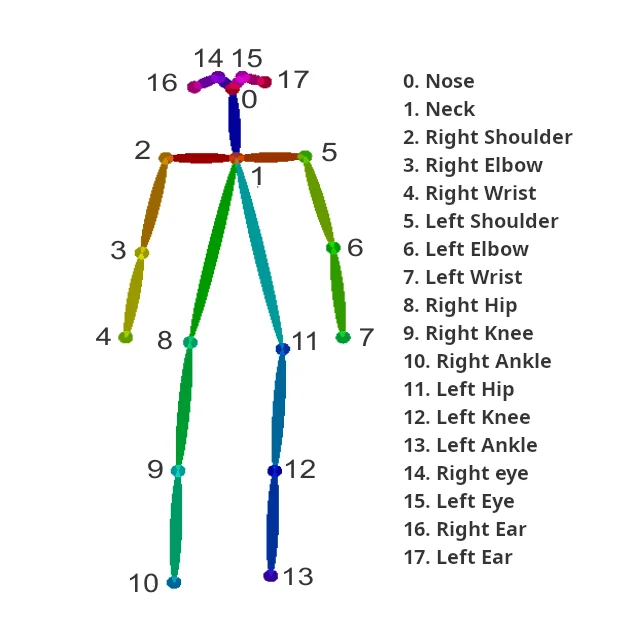

The way we're going to tackle the problem is to imagine the human face as a plane, the **normal vector** to which is our gaze direction.

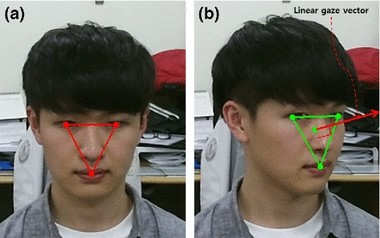

In our case, we have the two eyes and the nose as our reference points, and from these we need to calculate the normal vector to the plane those three points form.

The equation to get the normal vector to plane constructed from three points, v0, v1 and v2, is as follows:

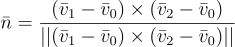

**Question**
* Does the order of the three points matter?

In [ ]:
def get_normal(v0,v1,v2):
  '''
  YOUR CODE GOES HERE

  Hint: v0, v1 and v2 are all vectors
  Hint: the cross product between a and be can be called using np.cross(a,b)

  This function should return a vector
  '''

In [ ]:
#@title Solution

def get_normal(v0,v1,v2):
  t1 = v1-v0
  t2 = v2-v0
  n = np.cross(t1,t2)
  return normalise(n)

Now we can calculate the face orientation for each timestep, using the two eyes and the nose.

**Question**
* Notice how we're replacing the depth of the nose with the average depth of the eyes. Why?
* Why are we returning the negative of the normal vector in the get_face_orientation function?

In [ ]:
def get_face_orientation(p0,p1,p2):
  for p in [p0,p1,p2]:
    if p[0] is None:
      return None
  p2n = np.array([(p0[0]+p1[0])/2,p2[1],p2[2]])
  return -get_normal(p0,p1,p2n)

poses['face_orientation'] = poses.apply(lambda row: get_face_orientation(
    np.array([row['r_eye.x'], row['r_eye.y'], row["r_eye.z"]]),
    np.array([row['l_eye.x'], row['l_eye.y'], row["l_eye.z"]]),
    np.array([row['nose.x'], row['nose.y'], row["nose.z"]]),
    ),axis=1)
poses

,Timestamp,nose.x,nose.y,nose.z,neck.x,neck.y,neck.z,r_sho.x,r_sho.y,r_sho.z,...,l_eye.y,l_eye.z,r_ear.x,r_ear.y,r_ear.z,l_ear.x,l_ear.y,l_ear.z,distance,face_orientation
0,1.701078e+18,-1.741000,-0.158583,0.168312,-1.666000,-0.299115,0.022367,-1.572000,-0.339493,0.017016,...,-0.159494,0.201167,-1.626,-0.279243,0.169885,0.000000,0.000000,0.000000,1.692786,"[0.3544235611713639, 0.8288352728839307, 0.432..."
1,1.701078e+18,-1.684000,-0.144629,0.175945,-1.684000,-0.271679,0.031371,-1.576000,-0.319857,0.021159,...,-0.140466,0.213606,-1.635,-0.272281,0.179333,0.000000,0.000000,0.000000,1.706063,"[0.3715165197912428, 0.8723066987296658, 0.317..."
2,1.701078e+18,-1.684000,-0.127105,0.184707,-1.679000,-0.240296,0.031278,-1.580000,-0.312448,0.021213,...,-0.113353,0.218581,-1.639,-0.268683,0.184035,0.000000,0.000000,0.000000,1.696397,"[0.772778815716646, 0.5976380552903642, 0.2136..."
3,1.701078e+18,-1.666000,-0.121412,0.182733,-1.707000,-0.222099,0.031799,-1.592000,-0.302396,0.021374,...,-0.099741,0.221741,-1.613,-0.247636,0.189509,0.000000,0.000000,0.000000,1.721682,"[0.7581994780939426, 0.6408510936206073, 0.120..."
4,1.701078e+18,-1.630000,-0.110308,0.183025,-1.712000,-0.200481,0.031893,-1.601000,-0.295775,0.021495,...,-0.089378,0.221868,-1.609,-0.230278,0.193224,0.000000,0.000000,0.000000,1.723994,"[0.9112003910535947, 0.4024276703512302, 0.088..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,1.701078e+18,-0.685701,-0.152044,0.143337,-0.676614,-0.021267,0.006287,-0.802800,-0.120152,-0.006745,...,-0.120138,0.182364,0.000,0.000000,0.000000,-0.709669,-0.032129,0.179843,0.676977,"[0.9689070032440102, -0.2469890604928118, 0.01..."
256,1.701078e+18,-0.711109,-0.178248,0.143661,-0.676649,-0.035533,0.005334,-0.795040,-0.126705,-0.011017,...,-0.145070,0.180911,0.000,0.000000,0.000000,-0.730342,-0.055078,0.179820,0.677603,"[0.9596636654355025, -0.27900138597411184, 0.0..."
257,1.701078e+18,-0.729476,-0.200393,0.145092,-0.672501,-0.049244,0.005956,-0.776159,-0.129808,-0.011596,...,-0.166466,0.181971,0.000,0.000000,0.000000,-0.745427,-0.075640,0.181515,0.674328,"[0.9582327242124381, -0.2810342951601447, 0.05..."
258,1.701078e+18,-0.742469,-0.219768,0.148236,-0.663974,-0.061956,0.009259,-0.748721,-0.129718,-0.007195,...,-0.184933,0.183212,0.000,0.000000,0.000000,-0.753317,-0.093333,0.182512,0.666922,"[0.9591831568143991, -0.2751434118959917, 0.06..."


So if we know where the person is looking, we can calculate if they're looking at the robot...


...how?

In [ ]:
def angle_between(vec1,vec2):
  # Returns the angle between vec1 and vec2
  return np.arccos((np.dot(vec1,vec2))/(np.linalg.norm(vec1)*np.linalg.norm(vec2)))

def facing_point(face_orientation,a,b,angle):
  '''
  YOUR CODE GOES HERE

  face_orientation - a vector [x,y,z] representing where the person is facing
  a - a vector [x,y,z] representing the origin of the person's gaze (we'll use their nose)
  b - a vector [x,y,z] representing the point we're querying (we'll use the robot's position)
  angle - an angle in degrees, representing the "size of our gaze"

  This function should return True if the person is looking at point b, and False otherwise
  '''
  theta = angle/180*np.pi # Convert to rad
  ...

  '''
  YOUR CODE GOES HERE

  Hint: what 3D shape could we construct from face_orientation and angle?
  Hint: you'll need to use the angle_between function
  '''

In [ ]:
#@title Solution

def facing_point(face_orientation,a,b,angle):
  theta = angle/180*np.pi # Convert to rad

  if face_orientation is None or a is None or b is None:
      return False

  angle_ab = angle_between(b-a,face_orientation)

  if angle_ab<=theta:
      return True

  return False

Let's generate an animation to illustrate these features at every timestep.

In [ ]:
poses['facing'] = poses.apply(lambda row: facing_point(
    row['face_orientation'],
    np.array([row['nose.x'],row['nose.y'],row['nose.z']]),
    np.array([0,0,0]),
    30, # Our angle
    ), axis=1)

In [ ]:
feature_images = []
for i in range(len(annotated_images)):
  img = annotated_images[i]
  t = colour_timestamps[i] + 3619608177230159
  # Find nearest 3d pose
  if t < poses["Timestamp"].iloc[0]:
    feature_images.append(img)
    continue
  if t > poses["Timestamp"].iloc[-1]:
    feature_images.append(img)
    continue
  face_i = find_neighbours(t,poses,"Timestamp")
  row = poses.loc[face_i[0]]
  img = copy.deepcopy(img)
  fimg = cv2.putText(img, f"Facing: {row['facing']}", (5, 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  fimg = cv2.putText(fimg, f"Distance: {row['distance']}", (5, 60), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  feature_images.append(fimg)

In [ ]:
plot_sequence_images(feature_images)

<Figure size 640x480 with 0 Axes>

Instead of a binary True or False, let's calculate a score from 0 to 1, where 1 is a direct gaze and 0 is looking directly 90 degrees away or more.

In [ ]:
def gaze_score(face_orientation,nose_vec):
  '''

  YOUR CODE GOES HERE

  face_orientation - a vector [x,y,z] representing where the person is facing
  nose_vec - a vector [x,y,z] representing the origin of the person's gaze (we'll use their nose)

  This function should return a number between 0 and 1 as specified above
  '''
  ...

  '''
  YOUR CODE GOES HERE

  Hint: this should look very similar to the facing_point function
  Hint: the robot is at [0,0,0]
  Hint: remember that 1 is a direct gaze, and 0 is 90 degrees or more
  '''
  ...

In [ ]:
#@title Solution

def gaze_score(face_orientation,nose_vec):
  max_angle = np.pi/2
  if face_orientation is None or nose_vec[0] is None:
      return 0

  angle_ab = angle_between(np.array([0,0,0])-nose_vec,face_orientation)

  if angle_ab > max_angle:
    return 0
  else:
    return 1 - angle_ab/max_angle

Let's plot the gaze score on our animation

In [ ]:
poses['gaze_score'] = poses.apply(lambda row: gaze_score(
  row['face_orientation'],
  np.array([row['nose.x'],row['nose.y'],row['nose.z']]),
  ), axis=1)

In [ ]:
gaze_images = []
for i in range(len(annotated_images)):
  img = annotated_images[i]
  t = colour_timestamps[i] + 3619608177230159
  # Find nearest 3d pose
  if t < poses["Timestamp"].iloc[0]:
    feature_images.append(img)
    continue
  if t > poses["Timestamp"].iloc[-1]:
    feature_images.append(img)
    continue
  face_i = find_neighbours(t,poses,"Timestamp")
  row = poses.loc[face_i[0]]
  img = copy.deepcopy(img)
  fimg = cv2.putText(img, f"Gaze Score: {row['gaze_score']}", (5, 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  fimg = cv2.putText(fimg, f"Distance: {row['distance']}", (5, 60), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  gaze_images.append(fimg)

In [ ]:
plot_sequence_images(gaze_images)

<Figure size 640x480 with 0 Axes>

## Section 4 - Decision Making

Now that we have distance and a gaze score, let's use these features to inform a robot's decision-making.

Suppose we have a social robot that is designed to initiate conversations with people and keep their attention for as long as possible. This robot has a number of actions it can perform:

*   *DO_NOTHING* - the robot does nothing
*   *INITIATE_INTERACTION* - the robot tries to attract attention and start a conversation
* *MAINTAIN_INTERACTION* - the robot carries on interacting with someone it is already interacting with
* *RECAPTURE_INTERACTION* - the robot tries to regain the attention of someone who is losing engagement with the robot

To define our robot's behaviour, we're going to use a decision-making architecture called a **finite state machine**. How this works is we imagine a number of states the robot can be in. Each decision the robot makes can then cause it to transition to a new state, with different transition rules defined for each state.

Finite state machines are often represented using diagrams. Here's the diagram for what we want our robot to do:

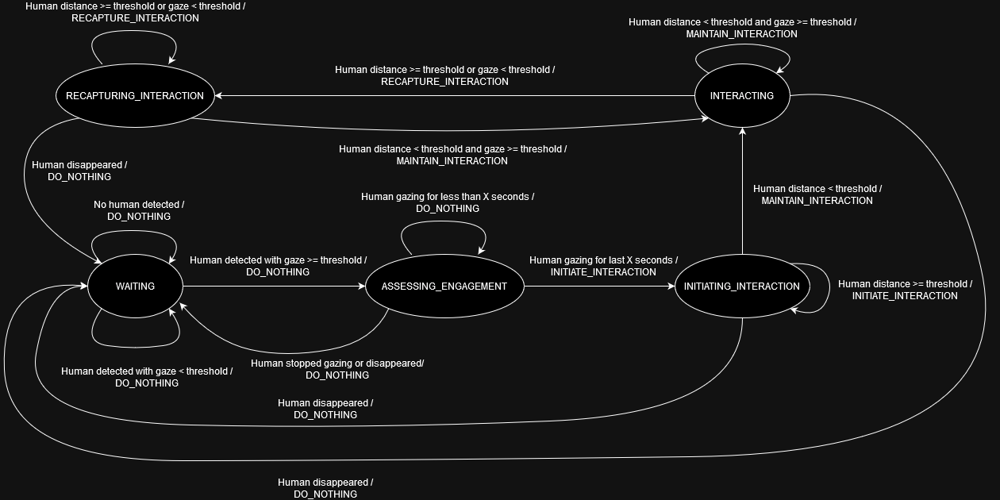

Each state is a bubble, and the possible transitions and robot actions are represented by arrows coming out of each state. For this diagram, you can read each transition as follows "condition / robot action", where condition is the thing that needs to be true in order to trigger the transition and robot action is the action the robot takes during the transition. Notice that each state can have a "self-transition", where the next state is the same as the one before.

In our example, we want five states, defined as follows:

*   WAITING - the robot is waiting for something interesting to happen
*   ASSESSING_ENGAGEMENT - a human is looking at the robot and if they look for long enough, the robot will do something
* INITIATING_INTERACTION - the robot is starting an interaction with the human
* INTERACTING - the human is close enough to the robot and is actively engaged with the robot
* RECAPTURING_INTERACTION - the human has moved away or has stopped looking at the robot, and the robot is trying to get their attention back again

We can use the following enumeration classes to store our state and decisions:

In [ ]:
from enum import Enum

class RobotStates(Enum):
  WAITING = 0
  ASSESSING_ENGAGEMENT = 1
  INITIATING_INTERACTION = 2
  INTERACTING = 3
  RECAPTURING_INTERACTION = 4

class RobotActions(Enum):
  DO_NOTHING = 0
  INITIATE_INTERACTION = 1
  MAINTAIN_INTERACTION = 2
  RECAPTURE_INTERACTION = 3

Now, let's code up the logic represented by the finite state machine. Note that the robot makes use of three parameters:

*   gaze_threshold - the gaze score should be higher than this if a person is looking at the robot
*   attention_duration_trigger - the length of time a person should be looking at the robot before the robot starts initiating an interaction, in seconds
* distance_threshold - the distance within which a person is considered close enough to interact with, in metres


In [ ]:
class Robot:
  def __init__(self,gaze_threshold=0.75,attention_duration_trigger=1,distance_threshold=1):
    self.time = None
    self.human_distance = None
    self.human_gaze = None
    self.state = RobotStates.WAITING
    self.gaze_threshold = gaze_threshold
    self.distance_threshold = distance_threshold
    self.attention_duration_trigger = attention_duration_trigger
    '''
    IF YOU WANT TO MAKE ANY CHANGES, MAKE THEM HERE
    '''
    self.first_attention = None

  def update(self,distance,gaze,timestamp):
    '''
    YOU DON'T NEED TO CHANGE THIS
    '''
    self.human_distance = distance
    self.human_gaze = gaze
    self.time = timestamp

  def make_decision(self):
    '''
    This function must return a robot action e.g. return RobotActions.DO_NOTHING
    It can also change the state e.g. self.state = RobotStates.ASSESSING_ENGAGEMENT
    '''
    if self.state == RobotStates.WAITING:
      '''
      YOUR CODE GOES HERE

      Logic for the WAITING state
      '''
      ...

      '''
      YOUR CODE GOES HERE

      Logic for the ASSESSING_ENGAGEMENT state

      Hint: The timestamp is in nanoseconds (1 second = 1000000000 nanoseconds)
      '''
      if self.human_gaze >= self.gaze_threshold:
        ...

      '''
      YOUR CODE GOES HERE

      Logic for the INITIATING_INTERACTION state
      '''
      if self.human_distance < self.distance_threshold:
        ...
      '''
      YOUR CODE GOES HERE

      Logic for the INTERACTING state
      '''

      if self.human_distance is None or self.human_gaze is None:
        ...
      '''
      YOUR CODE GOES HERE

      Logic for the RECAPTURING_INTERACTION state
      '''
      if self.human_distance is None or self.human_gaze is None:
        ...

In [ ]:
#@title Solution

class Robot:
  def __init__(self,gaze_threshold=0.75,attention_duration_trigger=1,distance_threshold=1):
    self.time = None
    self.human_distance = None
    self.human_gaze = None
    self.state = RobotStates.WAITING
    self.gaze_threshold = gaze_threshold
    self.distance_threshold = distance_threshold
    self.attention_duration_trigger = attention_duration_trigger
    self.first_attention = None

  def update(self,distance,gaze,timestamp):
    self.human_distance = distance
    self.human_gaze = gaze
    self.time = timestamp

  def make_decision(self):
    '''
    This function must return a robot action e.g. return RobotActions.DO_NOTHING
    It can also change the state e.g. self.state = RobotStates.ASSESSING_ENGAGEMENT
    '''
    if self.state == RobotStates.WAITING:
      if self.human_gaze is None or self.human_distance is None:
        return RobotActions.DO_NOTHING

      if self.first_attention is None and self.human_gaze >= self.gaze_threshold:
        self.first_attention = self.time
        self.state = RobotStates.ASSESSING_ENGAGEMENT
        return RobotActions.DO_NOTHING
      else:
        return RobotActions.DO_NOTHING
    elif self.state == RobotStates.ASSESSING_ENGAGEMENT:

      if self.human_gaze >= self.gaze_threshold:
        if self.time - self.first_attention > self.attention_duration_trigger * 1000000000:
          self.state = RobotStates.INITIATING_INTERACTION
          self.first_attention = None
          return RobotActions.INITIATE_INTERACTION
        else:
          return RobotActions.DO_NOTHING
      else:
        self.first_attention = None
        self.state = RobotStates.WAITING
        return RobotActions.DO_NOTHING
    elif self.state == RobotStates.INITIATING_INTERACTION:

      if self.human_distance < self.distance_threshold:
        self.state = RobotStates.INTERACTING
        return RobotActions.MAINTAIN_INTERACTION
      elif self.human_distance is None:
        self.state = RobotStates.WAITING
        return RobotActions.DO_NOTHING
      else:
        return RobotActions.INITIATE_INTERACTION
    elif self.state == RobotStates.INTERACTING:

      if self.human_distance is None or self.human_gaze is None:
        self.state = RobotStates.WAITING
        return RobotActions.DO_NOTHING
      elif self.human_distance < self.distance_threshold and self.human_gaze >= self.gaze_threshold:
        return RobotActions.MAINTAIN_INTERACTION
      else:
        self.state = RobotStates.RECAPTURING_INTERACTION
        return RobotActions.RECAPTURE_INTERACTION
    elif self.state == RobotStates.RECAPTURING_INTERACTION:

      if self.human_distance is None or self.human_gaze is None:
        self.state = RobotStates.WAITING
        return RobotActions.DO_NOTHING
      elif self.human_distance < self.distance_threshold and self.human_gaze >= self.gaze_threshold:
        self.state = RobotStates.INTERACTING
        return RobotActions.MAINTAIN_INTERACTION
      else:
        return RobotActions.RECAPTURE_INTERACTION


Let's see how our decision-making function works in practice. We can generate an animation to show the current state and action at any timestep.

In [ ]:
robot = Robot()
states = []
decisions = []
for index, row in poses.iterrows():
  states.append(robot.state)
  robot.update(row["distance"],row["gaze_score"],row["Timestamp"])
  decisions.append(robot.make_decision())
poses["state"] = states
poses["decision"] = decisions

In [ ]:
decision_images = []
for i in range(len(annotated_images)):
  img = annotated_images[i]
  t = colour_timestamps[i] + 3619608177230159
  # Find nearest 3d pose
  if t < poses["Timestamp"].iloc[0]:
    feature_images.append(img)
    continue
  if t > poses["Timestamp"].iloc[-1]:
    feature_images.append(img)
    continue
  face_i = find_neighbours(t,poses,"Timestamp")
  row = poses.loc[face_i[0]]
  img = copy.deepcopy(img)
  fimg = cv2.putText(img, f"State: {row['state'].name}", (5, 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  fimg = cv2.putText(fimg, f"Decision: {row['decision'].name}", (5, 60), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 1)
  decision_images.append(fimg)

In [ ]:
plot_sequence_images(decision_images)

<Figure size 640x480 with 0 Axes>

If you're interested in seeing this kind of perception and decision-making being used on a real robot, check out the following papers we authored:

*   [Towards Explainable Proactive Robot Interactions for Groups of
People in Unstructured Environments](https://tamlinlove.github.io/assets/hri_lbr_24.pdf)
*   [What Would I Do If...? Promoting Understanding in HRI through
Real-Time Explanations in the Wild](https://tamlinlove.github.io/assets/ROMAN24.pdf)


The `annotate_image` function takes an image and an optional image shape as input. It creates a copy of the input image and then draws the human skeleton on it based on the joint coordinates stored in the `HumanBody` object. It iterates through each joint and draws a circle at its pixel coordinates if the coordinates are not `None`. It then iterates through the skeleton pairs and draws a line connecting the two joints in each pair if both joints have valid coordinates. The function returns the annotated image.